In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
train = pd.read_csv('../input/bri-data-hackathon-pa/train.csv')
pd.options.display.max_rows=11153
pd.options.display.max_columns=11153
train

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,Y,1,level_0,2.86,2011,4,2,3,2,3,0,46.37,0.0,0
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,Y,0,level_1,7.28,2007,4,4,3,0,0,1,47.68,0.0,0
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,Y,1,level_1,0.00,1989,28,10,9,6,2,1,40.73,0.0,0
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,Y,2,level_1,0.00,1987,29,11,6,0,4,10,47.42,0.0,1
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,Y,3,level_1,7.20,1985,30,9,8,2,3,0,47.18,0.0,0
5,JG05,2.828427,PG06,2.121320,1.118034,RM_type_A,1,1971,Y,3,level_1,0.00,1990,28,7,9,4,0,0,48.46,0.0,0
6,JG05,2.828427,PG06,2.345208,2.102380,RM_type_A,1,1969,Y,2,level_1,0.00,1988,29,8,6,2,8,0,60.38,0.0,0
7,JG05,2.828427,PG06,2.236068,1.581139,RM_type_C,2,1968,Y,2,level_1,0.00,1987,29,6,8,1,3,4,14.71,0.0,0
8,JG04,1.118034,PG03,1.118034,0.412311,RM_type_B,1,1989,Y,0,level_1,3.01,2007,3,2,2,0,9,0,26.76,0.0,0
9,JG04,1.118034,PG03,1.118034,0.412311,RM_type_B,2,1991,N,0,level_1,4.19,2009,3,2,2,0,3,0,41.45,0.0,1


In [3]:
train.isna().sum()

job_level                                0
job_duration_in_current_job_level        0
person_level                             0
job_duration_in_current_person_level     0
job_duration_in_current_branch           0
Employee_type                            0
gender                                   0
age                                      0
marital_status_maried(Y/N)               0
number_of_dependences                    0
Education_level                          0
GPA                                      0
year_graduated                           0
job_duration_from_training               0
branch_rotation                          0
job_rotation                             0
assign_of_otherposition                  0
annual leave                             0
sick_leaves                              0
Last_achievement_%                       1
Achievement_above_100%_during3quartal    1
Best Performance                         0
dtype: int64

In [4]:
train['Last_achievement_%'] = train.fillna(train['Last_achievement_%'].mean())
train['Achievement_above_100%_during3quartal'] = train['Achievement_above_100%_during3quartal'].astype('float64') 
train['Best Performance'] = train['Best Performance'].astype('float64') 

In [5]:
train['Achievement_above_100%_during3quartal'] = train.fillna(train['Achievement_above_100%_during3quartal'].mean())

In [6]:
train.drop_duplicates(inplace=True)

In [7]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train['job_duration_in_current_job_level1'] = le.fit_transform(train['job_duration_in_current_job_level'])
train['job_level1'] = le.fit_transform(train['job_level'])
train['Employee_type1'] = le.fit_transform(train['Employee_type'])
train['marital_status_maried(Y/N)'] = le.fit_transform(train['marital_status_maried(Y/N)'])
train['Education_level1'] = le.fit_transform(train['Education_level'])
train['Last_achievement_%1'] = le.fit_transform(train['Last_achievement_%'])
train['Achievement_above_100%_during3quartal1'] = le.fit_transform(train['Achievement_above_100%_during3quartal'])

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11151 entries, 0 to 11152
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   job_level                               11151 non-null  object 
 1   job_duration_in_current_job_level       11151 non-null  float64
 2   person_level                            11151 non-null  object 
 3   job_duration_in_current_person_level    11151 non-null  float64
 4   job_duration_in_current_branch          11151 non-null  float64
 5   Employee_type                           11151 non-null  object 
 6   gender                                  11151 non-null  int64  
 7   age                                     11151 non-null  int64  
 8   marital_status_maried(Y/N)              11151 non-null  int64  
 9   number_of_dependences                   11151 non-null  int64  
 10  Education_level                         11151 non-null  ob

In [9]:
train.head()

,job_level,job_duration_in_current_job_level,person_level,job_duration_in_current_person_level,job_duration_in_current_branch,Employee_type,gender,age,marital_status_maried(Y/N),number_of_dependences,Education_level,GPA,year_graduated,job_duration_from_training,branch_rotation,job_rotation,assign_of_otherposition,annual leave,sick_leaves,Last_achievement_%,Achievement_above_100%_during3quartal,Best Performance,job_duration_in_current_job_level1,job_level1,Employee_type1,Education_level1,Last_achievement_%1,Achievement_above_100%_during3quartal1
0,JG04,1.352775,PG03,1.352775,1.732051,RM_type_A,2,1985,1,1,level_0,2.86,2011,4,2,3,2,3,0,JG04,JG04,0.0,22,1,0,0,1,1
1,JG04,1.292285,PG03,1.292285,1.039230,RM_type_A,2,1989,1,0,level_1,7.28,2007,4,4,3,0,0,1,JG04,JG04,0.0,20,1,0,1,1,1
2,JG05,2.565151,PG06,2.308679,1.780449,RM_type_C,1,1970,1,1,level_1,0.00,1989,28,10,9,6,2,1,JG05,JG05,0.0,76,2,2,1,2,2
3,JG05,2.828427,PG06,1.000000,1.385641,RM_type_A,2,1967,1,2,level_1,0.00,1987,29,11,6,0,4,10,JG05,JG05,1.0,92,2,0,1,2,2
4,JG05,2.828427,PG06,2.828427,0.707107,RM_type_A,2,1965,1,3,level_1,7.20,1985,30,9,8,2,3,0,JG05,JG05,0.0,92,2,0,1,2,2


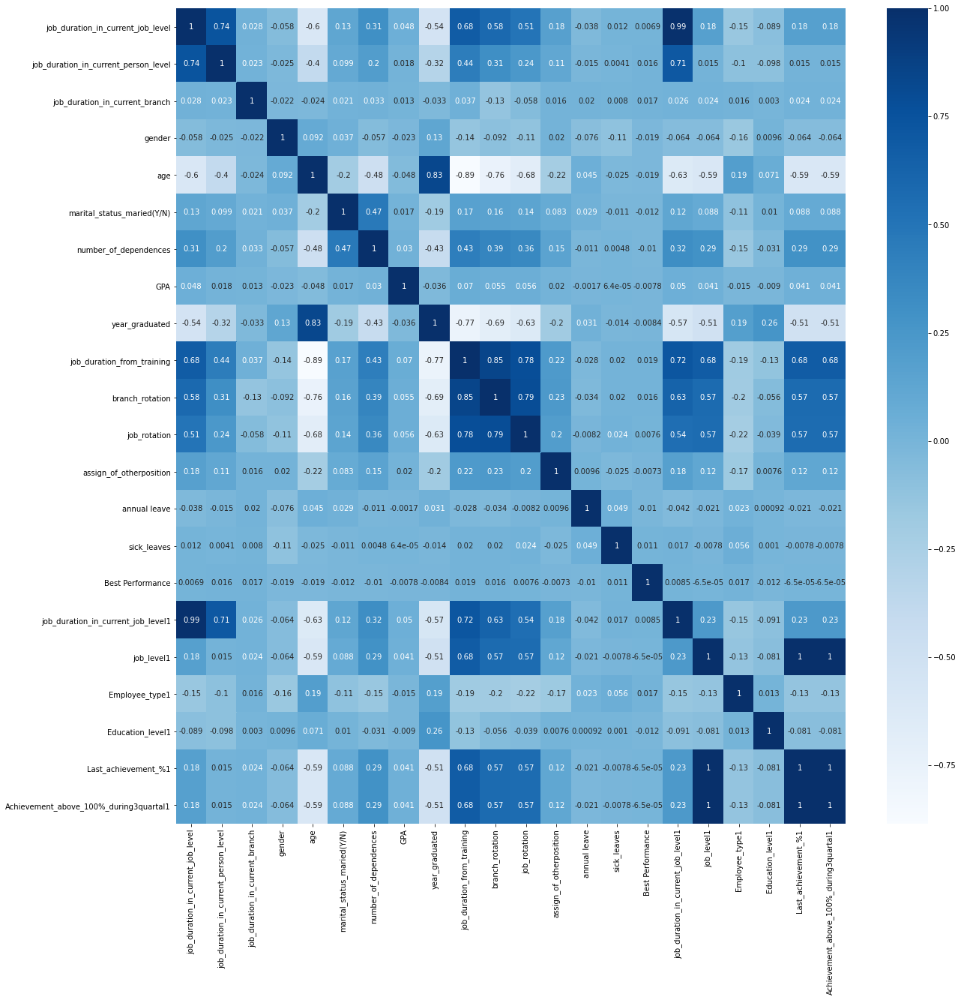

In [10]:
plt.figure(figsize=(20,20))
sns.heatmap(train.corr(),annot=True, cmap='Blues')

In [11]:
train.columns

Index(['job_level', 'job_duration_in_current_job_level', 'person_level',
       'job_duration_in_current_person_level',
       'job_duration_in_current_branch', 'Employee_type', 'gender', 'age',
       'marital_status_maried(Y/N)', 'number_of_dependences',
       'Education_level', 'GPA', 'year_graduated',
       'job_duration_from_training', 'branch_rotation', 'job_rotation',
       'assign_of_otherposition', 'annual leave', 'sick_leaves',
       'Last_achievement_%', 'Achievement_above_100%_during3quartal',
       'Best Performance', 'job_duration_in_current_job_level1', 'job_level1',
       'Employee_type1', 'Education_level1', 'Last_achievement_%1',
       'Achievement_above_100%_during3quartal1'],
      dtype='object')

In [12]:
x = train[['job_duration_in_current_job_level','job_duration_in_current_person_level',
          'job_duration_in_current_branch','job_duration_from_training',
          'branch_rotation', 'job_rotation','sick_leaves','job_duration_in_current_job_level1',
          'Employee_type1']]
y = train['Best Performance']

In [13]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.538,random_state=42)

In [14]:
from sklearn.linear_model import LogisticRegression
model_logreg = LogisticRegression(solver='lbfgs', multi_class='auto')
model_logreg.fit(x_train,y_train)
predict = model_logreg.predict(x_test)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [15]:
df = pd.DataFrame(predict)
df.head()

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0


In [16]:
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report, precision_score
print(precision_score(y_test, predict))

0.0


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
